In [6]:
import openpyxl as op
# Read all sheets form the xlsx
wb = op.load_workbook(r'gencode_v41_stat.tsv.xlsx')

for sh in wb.worksheets:
    print(sh)

<Worksheet "alignment-analysis-chr1.tsv">
<Worksheet "alignment-analysis-chr2">
<Worksheet "alignment-analysis-chr3">
<Worksheet "alignment-analysis-chr4">
<Worksheet "alignment-analysis-chr5">
<Worksheet "alignment-analysis-chr6">
<Worksheet "alignment-analysis-chr7">
<Worksheet "alignment-analysis-chr8">
<Worksheet "alignment-analysis-chr9">
<Worksheet "alignment-analysis-chr10">
<Worksheet "alignment-analysis-chr11">
<Worksheet "alignment-analysis-chr12">
<Worksheet "alignment-analysis-chr13">
<Worksheet "alignment-analysis-chr14">
<Worksheet "alignment-analysis-chr15">
<Worksheet "alignment-analysis-chr16">
<Worksheet "alignment-analysis-chr17">
<Worksheet "alignment-analysis-chr18">
<Worksheet "alignment-analysis-chr19">
<Worksheet "alignment-analysis-chr20">
<Worksheet "alignment-analysis-chr21">
<Worksheet "alignment-analysis-chr22">


### Number of isoforms vs count of splice events affecting protein region plot

In [7]:
# for i in range(1, sh.max_row+1):
#     print("\n")
#     for j in range(1, sh.max_column+1):
#         cell_obj = sh.cell(row=i, column=j)
#         print(cell_obj.value, end=" ")

In [8]:
pb_stats = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_I = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_D = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_S = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}

for sh in wb.worksheets:
    count=1
    count_i=1
    count_d=1
    count_s=1
    for i in range(2, sh.max_row):
        c1_iso = sh.cell(row=i, column=2)
        c2_iso = sh.cell(row=i+1, column=2)
        c1_pb = sh.cell(row=i, column=9)
        c2_pb = sh.cell(row=i+1, column=9)
        #print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)

        # When iso are same
        if c1_iso.value == c2_iso.value:
            if c1_pb.value != c2_pb.value:
                #pblock is different for the iso
                #print("Different pb for same iso ",c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
                count+=1
                #print(count)
                c=str(c1_pb.value)
                if c.startswith("I"):
                    count_i+=1
                elif c.startswith("D"):
                    count_d+=1
                elif c.startswith("S"):
                    count_s+=1
        
            #else:
                #print("Same pb for same iso ",c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
                #print(count)
            
        #When iso are different
        else:
            if count > 10:
                print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
            pb_stats[count]+=1
            pb_stats_I[count_i]+=1
            pb_stats_D[count_d]+=1
            pb_stats_S[count_s]+=1
            count=1
            count_i=1
            count_d=1
            count_s=1

            # pblocks shared between two different transcripts
            # if c1_pb.value == c2_pb.value:
            #     print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
            #print(count)
        
        #print(pb_stats,'\n')

DNAH14-211 S(3925:4179|3068:3069) LBR-209 S(396:616|396:412)
SYNE2-211 S(6823:6908|6716:6819) SYNE2-228 S(0:4203|0:4)


In [9]:
print(pb_stats)
print(pb_stats_I)
print(pb_stats_D)
print(pb_stats_S)
print(sh.max_row)

{1: 38068, 2: 7345, 3: 1035, 4: 219, 5: 65, 6: 16, 7: 5, 8: 2, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 2, 15: 0}
{1: 45747, 2: 977, 3: 33, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0}
{1: 42285, 2: 4215, 3: 219, 4: 31, 5: 4, 6: 2, 7: 1, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0}
{1: 42725, 2: 3546, 3: 385, 4: 74, 5: 18, 6: 5, 7: 2, 8: 2, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0}
1536


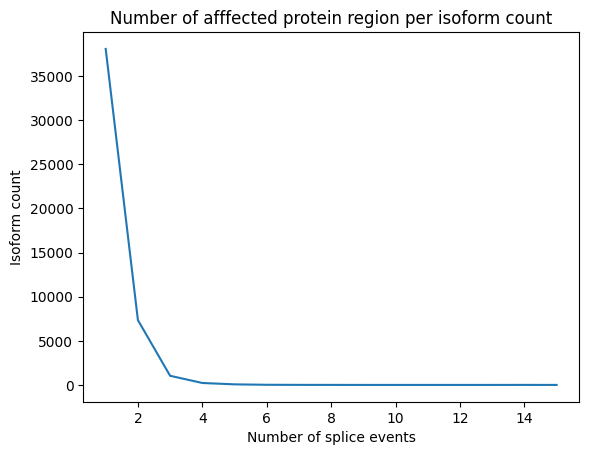

In [10]:
# Plotting
import matplotlib.pyplot as plt

myList = pb_stats.items()
myList = sorted(myList) 
x, y = zip(*myList) 

plt.plot(x, y)
plt.xlabel('Number of splice events')
plt.ylabel('Isoform count')
plt.title('Number of afffected protein region per isoform count')
plt.show()

plt.scatter() 1.9170533070137026
plt.plot() 0.44670717099506874


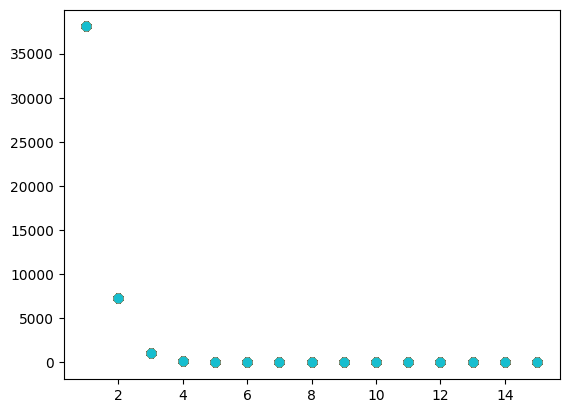

In [11]:
import timeit
event_count = pb_stats.values()
isoform_count = pb_stats.keys()


print(
    "plt.scatter()",
    timeit.timeit(
        "plt.scatter(isoform_count, event_count)",
        number=1000,
        globals=globals(),
    ),
)
print(
    "plt.plot()",
    timeit.timeit(
        "plt.plot(isoform_count, event_count, 'o')",
        number=1000,
        globals=globals(),
    ),
)


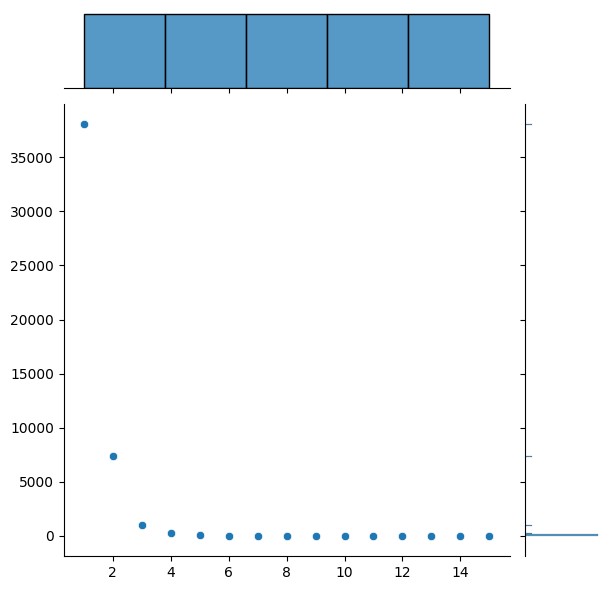

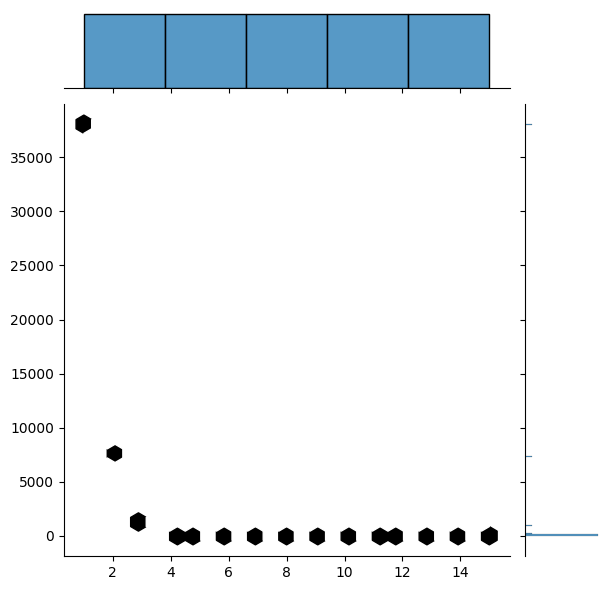

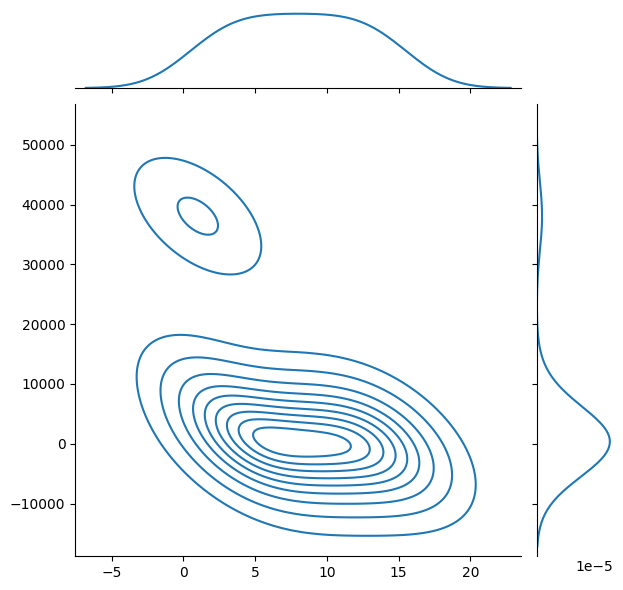

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
 
# plot
sns.jointplot(x=isoform_count, y=event_count, kind='scatter')
sns.jointplot(x=isoform_count, y=event_count, kind='hex')
sns.jointplot(x=isoform_count, y=event_count, kind='kde')

plt.show()

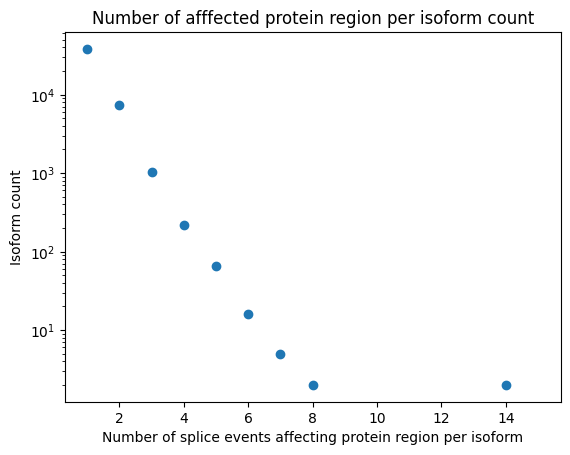

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# Basic chart
fig=plt.plot(isoform_count, event_count, linestyle='none', marker='o')

# Show the graph
plt.yscale('log')
plt.xlabel('Number of splice events affecting protein region per isoform')
plt.ylabel('Isoform count')
plt.title('Number of afffected protein region per isoform count')
fig = plt.gcf()

plt.show()
fig.savefig('isoform_event.png',dpi=1200)

### Size of affected protein regiopns vs number of isoform aggregate plot


In [48]:
import re
import openpyxl as op
# Read all sheets form the xlsx
wb = op.load_workbook(r'trial.xlsx')

In [72]:

for sh in wb.worksheets:
    print(sh)
pb_stats = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_size = []
pb_stats_size_I=[]
pb_stats_size_D=[]
pb_stats_size_S=[]

pb_stats_I = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_D = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_S = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}

def getsize(c1_pb_val, sh, c1_iso_val):
    temp = re.findall(r'\d+', c1_pb_val)
    res = list(map(int, temp))
    size = res[3]-res[2]
    # if  size == 0:
    #     print(sh, " : ", c1_iso_val, " : ", c1_pb_val, " : " ,str(res)," : ", size)
    pb_stats_size.append(size)
    if c1_iso_val.startswith("I"):
        pb_stats_size_I.append(size)
    elif c1_iso_val.startswith("D"):
        pb_stats_size_D.append(size)
    elif c1_iso_val.startswith("S"):
        pb_stats_size_S.append(size)
        
        
    #print(sh, " : ", c1_iso_val, " : ", c1_pb_val, " : " ,str(res)," : ", size)
    return 0

for sh in wb.worksheets:
    count=1
    count_i=1
    count_d=1
    count_s=1
    for i in range(2, sh.max_row):
        c1_iso = sh.cell(row=i, column=2)
        c2_iso = sh.cell(row=i+1, column=2)
        c1_pb = sh.cell(row=i, column=9)
        c2_pb = sh.cell(row=i+1, column=9)
        #print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)

        # When iso are same
        if c1_iso.value == c2_iso.value:
            if c1_pb.value != c2_pb.value:
                #pblock is different for the iso
                #print("Different pb for same iso ",c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
                count+=1
                #print(count)
                getsize(c1_pb.value, sh, c1_iso.value)
                c=str(c1_pb.value)
                if c.startswith("I"):
                    count_i+=1
                elif c.startswith("D"):
                    count_d+=1
                elif c.startswith("S"):
                    count_s+=1
        
            #else:
                #print("Same pb for same iso ",c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
                #print(count)
            
        #When iso are different
        else: 
            getsize(c1_pb.value, sh, c1_iso.value)
            pb_stats[count]+=1
            pb_stats_I[count_i]+=1
            pb_stats_D[count_d]+=1
            pb_stats_S[count_s]+=1
            count=1
            count_i=1
            count_d=1
            count_s=1
            

            # pblocks shared between two different transcripts
            # if c1_pb.value == c2_pb.value:
            #     print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
            #print(count)
        
        #print(pb_stats,'\n')

<Worksheet "alignment-analysis-chr1">
<Worksheet "alignment-analysis-chr2">
<Worksheet "alignment-analysis-chr3">
<Worksheet "alignment-analysis-chr4">
<Worksheet "alignment-analysis-chr5">
<Worksheet "alignment-analysis-chr6">
<Worksheet "alignment-analysis-chr7">
<Worksheet "alignment-analysis-chr8">
<Worksheet "alignment-analysis-chr9">
<Worksheet "alignment-analysis-chr10">
<Worksheet "alignment-analysis-chr11">
<Worksheet "alignment-analysis-chr12">
<Worksheet "alignment-analysis-chr13">
<Worksheet "alignment-analysis-chr14">
<Worksheet "alignment-analysis-chr15">
<Worksheet "alignment-analysis-chr16">
<Worksheet "alignment-analysis-chr17">
<Worksheet "alignment-analysis-chr18">
<Worksheet "alignment-analysis-chr19">
<Worksheet "alignment-analysis-chr20">
<Worksheet "alignment-analysis-chr21">
<Worksheet "alignment-analysis-chr22">
SAMD11-209 SAMD11-209 S(352:354|352:353) S(352:354|352:353) d(352:353|352:352) e(353:354|352:353)
SAMD11-202 SAMD11-202 D(0:179|0:0) D(0:179|0:0) d(0:1

In [75]:
import collections
counter = collections.Counter(pb_stats_size)
print(counter)
x1 = list(counter.keys())
y1 = list(counter.values())

Counter({0: 14092, 1: 7411, 2: 2362, 3: 1263, 7: 1235, 5: 1203, 6: 1194, 4: 1176, 8: 1026, 9: 1013, 10: 978, 11: 872, 13: 847, 14: 830, 12: 816, 15: 778, 16: 736, 17: 705, 19: 655, 18: 649, 21: 646, 20: 584, 25: 575, 24: 575, 23: 568, 22: 540, 28: 515, 29: 491, 26: 489, 27: 485, 31: 470, 33: 446, 30: 410, 36: 409, 32: 407, 37: 367, 35: 367, 38: 347, 34: 341, 42: 272, 41: 269, 40: 254, 39: 253, 44: 252, 43: 241, 45: 235, 48: 227, 49: 223, 47: 222, 46: 213, 50: 199, 53: 165, 51: 162, 52: 153, 56: 149, 54: 148, 61: 146, 58: 137, 57: 130, 60: 126, 55: 122, 59: 121, 65: 115, 63: 109, 66: 106, 62: 106, 64: 98, 71: 94, 67: 92, 70: 92, 69: 90, 72: 84, 78: 74, 68: 74, 73: 72, 74: 71, 77: 65, 85: 61, 76: 61, 89: 60, 83: 58, 82: 57, 81: 56, 75: 54, 87: 54, 92: 54, 95: 53, 79: 49, 88: 48, 91: 46, 93: 43, 86: 42, 84: 41, 100: 41, 80: 40, 94: 39, 90: 39, 97: 35, 103: 34, 98: 33, 104: 33, 126: 30, 102: 27, 110: 27, 99: 27, 107: 26, 106: 25, 105: 24, 128: 24, 116: 24, 109: 23, 101: 23, 136: 21, 133: 2

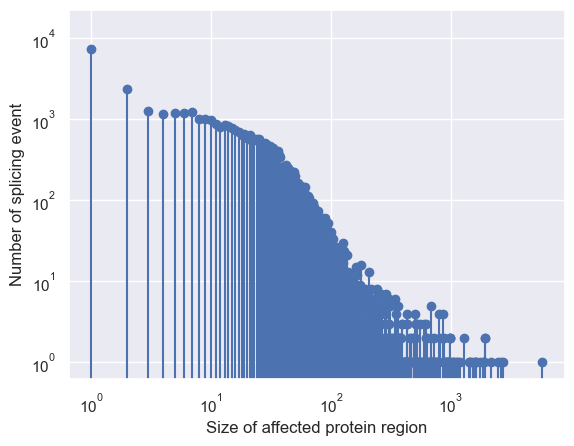

In [76]:
import matplotlib.pyplot as plt
import numpy as np

x = x1
y = y1

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Size of affected protein region')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size.png',dpi=1200)


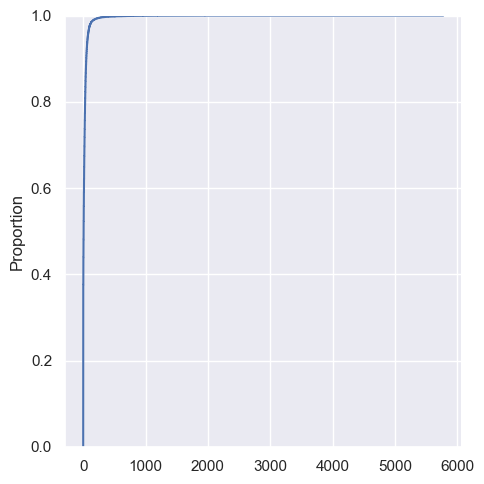

In [56]:
import seaborn as sns
sns.displot(pb_stats_size, kind="ecdf")

In [57]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter(
    x=x1,
    y=y1,
    mode='markers',
    marker=dict(
        color=[120, 125, 130, 135, 140, 145],
        size=[5, 15, 30, 40, 50, 65],
        showscale=True
        )
)])

fig.show()

In [59]:
counter = collections.Counter(pb_stats_size_I)
print(counter)
xi = list(counter.keys())
yi = list(counter.values())

counter = collections.Counter(pb_stats_size_D)
print(counter)
xd = list(counter.keys())
yd = list(counter.values())

counter = collections.Counter(pb_stats_size_S)
print(counter)
xs = list(counter.keys())
ys = list(counter.values())

Counter({0: 384, 1: 233, 2: 63, 7: 38, 6: 37, 15: 34, 8: 34, 16: 32, 10: 30, 5: 28, 12: 28, 4: 28, 3: 27, 14: 26, 13: 24, 17: 22, 25: 22, 9: 21, 18: 20, 19: 17, 11: 16, 31: 16, 36: 15, 21: 15, 29: 14, 47: 14, 23: 14, 60: 14, 35: 13, 52: 13, 22: 12, 40: 11, 26: 11, 42: 10, 20: 10, 32: 10, 28: 10, 49: 10, 50: 9, 64: 9, 54: 8, 38: 8, 58: 8, 24: 7, 27: 7, 33: 7, 44: 7, 56: 7, 30: 7, 83: 6, 126: 6, 45: 5, 37: 5, 34: 5, 62: 5, 66: 5, 46: 4, 77: 4, 51: 4, 84: 3, 80: 3, 63: 3, 67: 3, 61: 3, 57: 3, 55: 3, 59: 3, 39: 3, 85: 3, 127: 3, 93: 2, 78: 2, 41: 2, 103: 2, 180: 2, 73: 2, 107: 2, 106: 2, 240: 2, 71: 2, 75: 2, 53: 2, 92: 2, 87: 2, 82: 2, 147: 1, 2458: 1, 167: 1, 143: 1, 102: 1, 116: 1, 72: 1, 76: 1, 69: 1, 65: 1, 122: 1, 70: 1, 86: 1, 96: 1, 43: 1, 79: 1, 97: 1, 94: 1, 101: 1, 279: 1, 189: 1, 110: 1, 88: 1, 90: 1, 48: 1, 899: 1, 622: 1, 685: 1, 306: 1, 114: 1, 98: 1, 132: 1, 105: 1, 142: 1, 95: 1, 187: 1, 117: 1})
Counter({0: 576, 1: 256, 2: 85, 6: 67, 9: 62, 4: 61, 8: 56, 10: 48, 19: 48, 7

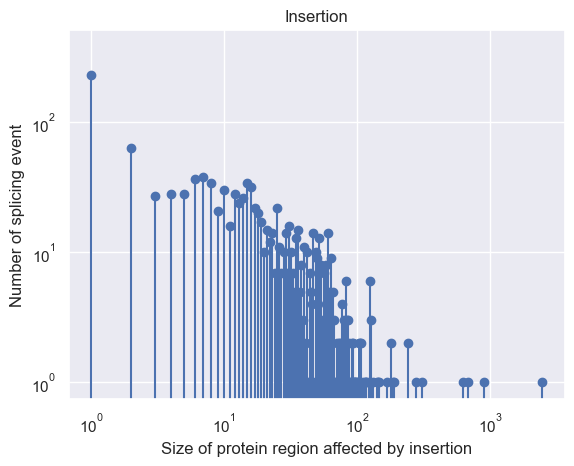

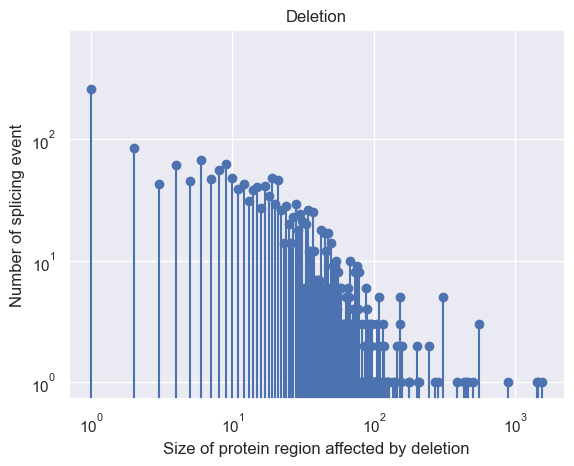

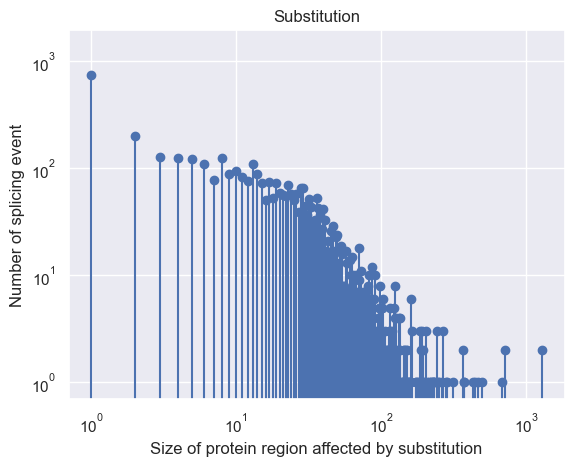

In [66]:
import matplotlib.pyplot as plt
import numpy as np

x = xi
y = yi

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.title("Insertion")
plt.xlabel('Size of protein region affected by insertion')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size_I.png',dpi=1200)



x = xd
y = yd

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.title("Deletion")
plt.xlabel('Size of protein region affected by deletion')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size_D.png',dpi=1200)



x = xs
y = ys

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.title("Substitution")
plt.xlabel('Size of protein region affected by substitution')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size_S.png',dpi=1200)


### Number of isoforms vs count of splice events affecting protein region plot for ragged and clean I/D/S

In [86]:
import re
import openpyxl as op
# Read all sheets form the xlsx
wb = op.load_workbook(r'trial.xlsx')

In [93]:

for sh in wb.worksheets:
    print(sh)
pb_stats = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_size = []
pb_stats_size_I=[]
pb_stats_size_D=[]
pb_stats_size_S=[]
pb_stats_size_rI=[]
pb_stats_size_rD=[]
pb_stats_size_rS=[]
c_rd=False
c_re=False


pb_stats_I = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_D = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}
pb_stats_S = {1:0, 2:0,3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0}


def getsize(c1_pb_val, sh, c1_iso_val, c_re, c_rd):
    temp = re.findall(r'\d+', c1_pb_val)
    res = list(map(int, temp))
    size = res[3]-res[2]
    # if  size == 0:
    #     print(sh, " : ", c1_iso_val, " : ", c1_pb_val, " : " ,str(res)," : ", size)
    pb_stats_size.append(size)
    if c1_iso_val.startswith("I"):
        pb_stats_size_I.append(size)
        if c_re == True and c_rd == True:
            pb_stats_size_rI.append(size)

    elif c1_iso_val.startswith("D"):
        pb_stats_size_D.append(size)
        if c_re == True and c_rd == True:
            pb_stats_size_rD.append(size)
    elif c1_iso_val.startswith("S"):
        pb_stats_size_S.append(size)
        if c_re == True and c_rd == True:
            pb_stats_size_rS.append(size)
        
        
    #print(sh, " : ", c1_iso_val, " : ", c1_pb_val, " : " ,str(res)," : ", size)
    return 0

for sh in wb.worksheets:
    count=1
    count_i=1
    count_d=1
    count_s=1
    count_ri=1
    count_rd=1
    count_rs=1
    for i in range(2, sh.max_row):
        c1_iso = sh.cell(row=i, column=2)
        c2_iso = sh.cell(row=i+1, column=2)
        c1_pb = sh.cell(row=i, column=9)
        c2_pb = sh.cell(row=i+1, column=9)
        c1_cb = sh.cell(row=i, column=10)
        c2_cb = sh.cell(row=i+1, column=10)
        #print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)

        # When iso are same
        if c1_iso.value == c2_iso.value:
            if c1_pb.value != c2_pb.value:
                #pblock is different for the iso
                #print("Different pb for same iso ",c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
                count+=1
                #print(count)
                getsize(c1_pb.value, sh, c1_iso.value, c_re, c_rd)
                c=str(c1_pb.value)
                if c.startswith("I"):
                    count_ri+=1
                elif c.startswith("D"):
                    count_rd+=1
                elif c.startswith("S"):
                    count_rs+=1
                if c_rd == True and c_re == True:
                    # pb_stats_rI[count_ri]+=1
                    # pb_stats_rD[count_rd]+=1
                    # pb_stats_rS[count_rs]+=1
                    c_rd == False
                    c_re == False

        
            else:
                #print("Same pb for same iso ",c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
                #print(count)
                print(c1_iso.value, c2_iso.value, c1_pb.value, c2_pb.value, c1_cb.value, c2_cb.value)
                if (c1_cb.value).startswith("d") or (c2_cb.value).startswith("d"):
                    c_rd = True
                elif (c1_cb.value).startswith("e") or (c2_cb.value).startswith("e"):
                    c_re = True     
                    
        #When iso are different
        else: 
            getsize(c1_pb.value, sh, c1_iso.value, c_re, c_rd)
            pb_stats[count]+=1
            pb_stats_I[count_i]+=1
            pb_stats_D[count_d]+=1
            pb_stats_S[count_s]+=1
            count=1
            count_i=1
            count_d=1
            count_s=1

            if c_rd == True and c_re == True:
                    # pb_stats_rI[count_ri]+=1
                    # pb_stats_rD[count_rd]+=1
                    # pb_stats_rS[count_rs]+=1
                    c_rd == False
                    c_re == False
             
        

            # pblocks shared between two different transcripts
            # if c1_pb.value == c2_pb.value:
            #     print(c1_iso.value, c1_pb.value, c2_iso.value, c2_pb.value)
            #print(count)
        
        #print(pb_stats,'\n')

<Worksheet "alignment-analysis-chr1">
<Worksheet "alignment-analysis-chr2">
<Worksheet "alignment-analysis-chr3">
<Worksheet "alignment-analysis-chr4">
<Worksheet "alignment-analysis-chr5">
<Worksheet "alignment-analysis-chr6">
<Worksheet "alignment-analysis-chr7">
<Worksheet "alignment-analysis-chr8">
<Worksheet "alignment-analysis-chr9">
<Worksheet "alignment-analysis-chr10">
<Worksheet "alignment-analysis-chr11">
<Worksheet "alignment-analysis-chr12">
<Worksheet "alignment-analysis-chr13">
<Worksheet "alignment-analysis-chr14">
<Worksheet "alignment-analysis-chr15">
<Worksheet "alignment-analysis-chr16">
<Worksheet "alignment-analysis-chr17">
<Worksheet "alignment-analysis-chr18">
<Worksheet "alignment-analysis-chr19">
<Worksheet "alignment-analysis-chr20">
<Worksheet "alignment-analysis-chr21">
<Worksheet "alignment-analysis-chr22">
SAMD11-209 SAMD11-209 S(352:354|352:353) S(352:354|352:353) d(352:353|352:352) e(353:354|352:353)
SAMD11-202 SAMD11-202 D(0:179|0:0) D(0:179|0:0) d(0:1

In [94]:
counter = collections.Counter(pb_stats_size_rI)
print(counter)
xri = list(counter.keys())
yri = list(counter.values())

counter = collections.Counter(pb_stats_size_rD)
print(counter)
xrd = list(counter.keys())
yrd = list(counter.values())

counter = collections.Counter(pb_stats_size_rS)
print(counter)
xrs = list(counter.keys())
yrs = list(counter.values())

Counter({0: 384, 1: 233, 2: 63, 7: 38, 6: 37, 15: 34, 8: 34, 16: 32, 10: 30, 5: 28, 12: 28, 4: 28, 3: 27, 14: 26, 13: 24, 17: 22, 25: 22, 9: 21, 18: 20, 19: 17, 11: 16, 31: 16, 36: 15, 21: 15, 29: 14, 47: 14, 23: 14, 60: 14, 35: 13, 52: 13, 22: 12, 40: 11, 26: 11, 42: 10, 20: 10, 32: 10, 28: 10, 49: 10, 50: 9, 64: 9, 54: 8, 38: 8, 58: 8, 24: 7, 27: 7, 33: 7, 44: 7, 56: 7, 30: 7, 83: 6, 126: 6, 45: 5, 37: 5, 34: 5, 62: 5, 66: 5, 46: 4, 77: 4, 51: 4, 84: 3, 80: 3, 63: 3, 67: 3, 61: 3, 57: 3, 55: 3, 59: 3, 39: 3, 85: 3, 127: 3, 93: 2, 78: 2, 41: 2, 103: 2, 180: 2, 73: 2, 107: 2, 106: 2, 240: 2, 71: 2, 75: 2, 53: 2, 92: 2, 87: 2, 82: 2, 147: 1, 2458: 1, 167: 1, 143: 1, 102: 1, 116: 1, 72: 1, 76: 1, 69: 1, 65: 1, 122: 1, 70: 1, 86: 1, 96: 1, 43: 1, 79: 1, 97: 1, 94: 1, 101: 1, 279: 1, 189: 1, 110: 1, 88: 1, 90: 1, 48: 1, 899: 1, 622: 1, 685: 1, 306: 1, 114: 1, 98: 1, 132: 1, 105: 1, 142: 1, 95: 1, 187: 1, 117: 1})
Counter({0: 576, 1: 256, 2: 85, 6: 67, 9: 62, 4: 61, 8: 56, 10: 48, 19: 48, 7

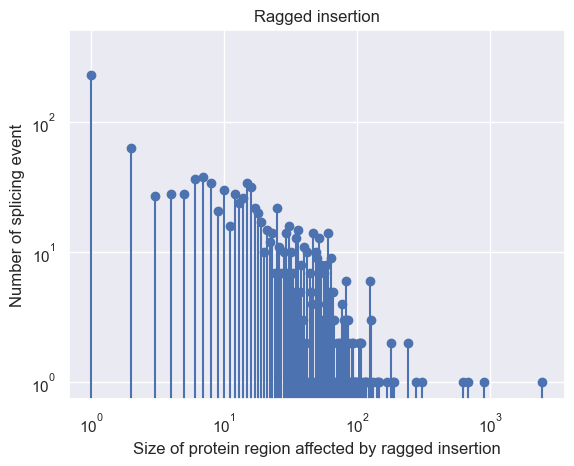

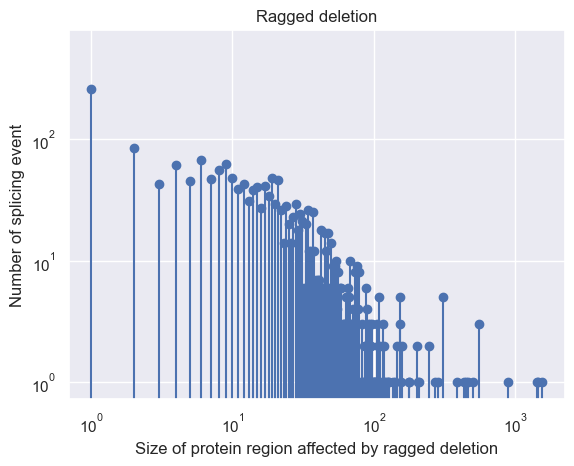

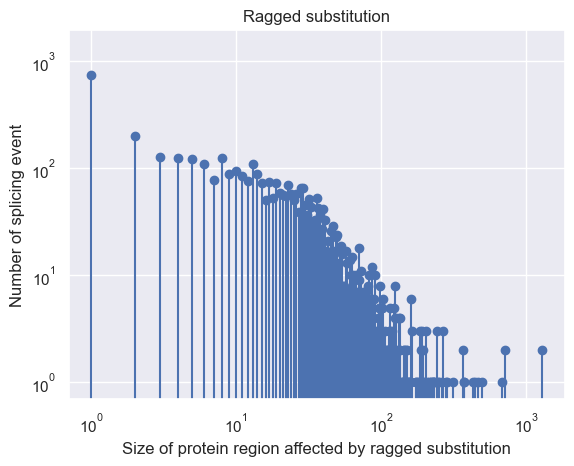

In [96]:
import matplotlib.pyplot as plt
import numpy as np

x = xri
y = yri

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.title("Ragged insertion")
plt.xlabel('Size of protein region affected by ragged insertion')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size_rI.png',dpi=1200)



x = xrd
y = yrd

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.title("Ragged deletion")
plt.xlabel('Size of protein region affected by ragged deletion')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size_rD.png',dpi=1200)



x = xrs
y = yrs

plt.stem(x, y)
plt.yscale('log')
plt.xscale('log')
plt.title("Ragged substitution")
plt.xlabel('Size of protein region affected by ragged substitution')
plt.ylabel('Number of splicing event')

fig = plt.gcf()

plt.show()
fig.savefig('isoform_event_size_rS.png',dpi=1200)
